<a href="https://colab.research.google.com/github/raeeynega/bulldozer-price-pridicttion/blob/main/Dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#!unzip "/content/drive/MyDrive/dog-breed-identification.zip" -d "/content/drive/MyDrive/dogo"

## End to End multi class dog breed classfication

rhis notebook builds an end to edn multiclass imaage classfifer using tensorflow2.0 and tensrflow hub

## 1.problem

identifying the breed of a dog goven an image of a dog.

## 2.Data

the dat we're using is from Kaggle's dog breed

-https://www.kaggle.com/c/dog-breed-identification

## 3. Evalutions

the Evaluation is a file with prediction probablities with each dog pred of each test image.

## 4.Features

some information about the data
* we're deaing with images(unstructures data) so it's prpbably the we use best we use deep learning/transfer learning.
* there are 120 breeds of Dogs(this means there are 120 different classes)
* these are aroounf 10000+ images in the traing set(thees images are labels)
* these are aroounf 10000+ images in the testing set(thees images are not labels)


### getting our worksapce ready
* importing TensorFlow 2.x
* importing TenorFlow Hub
* Make Sure we're using a GPU

In [ ]:
#importing tensor flow into colab
import tensorflow as tf
print("TF_VERSION",tf.__version__)


TF_VERSION 2.19.0


In [ ]:
#impoting necessary tools
import tensorflow_hub as hub
print("TF HUB:",hub.__version__)

TF HUB: 0.16.1


In [ ]:
#check for GPU availablity
print("GPU","AVILABLE(YESSSS)"  if tf.config.list_physical_devices("GPU") else "not really")

GPU AVILABLE(YESSSS)


## getting our data ready(turning into tensors)

with all machine learning models,our data has to be numerical format.so that's what we'll be doing first. Turning our images into Tensors

lets start by sccessing our data and checking out the labels

In [ ]:
# checkout the labels of our data
import pandas as pd
label_csv=pd.read_csv("/content/drive/MyDrive/dogo/labels.csv")
print(label_csv.describe())
print(label_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

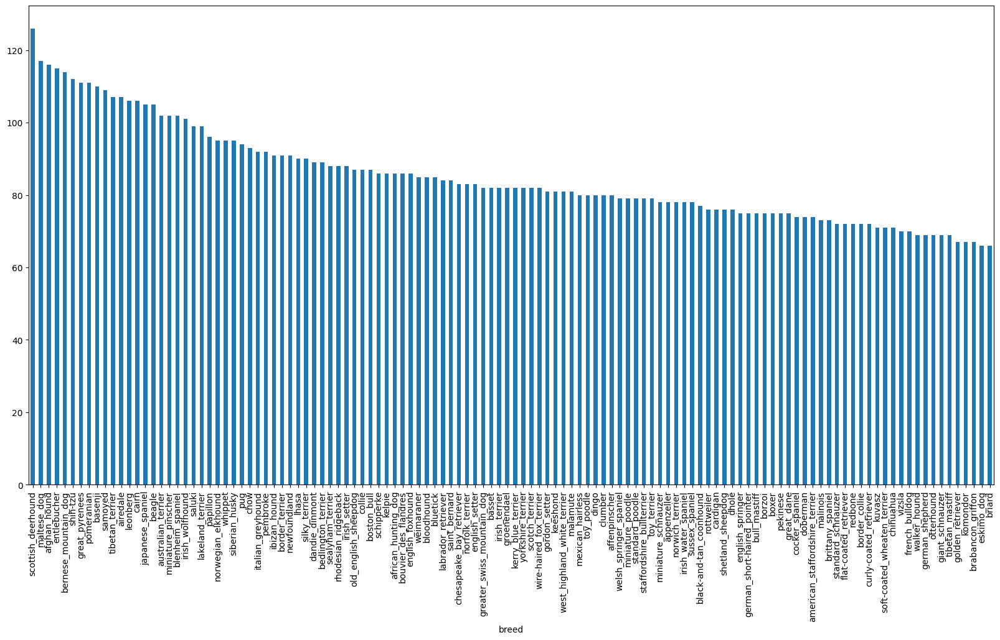

In [ ]:
## how many images are there of each breed?
label_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
label_csv["breed"].value_counts().mean()

np.float64(85.18333333333334)

In [ ]:
label_csv["breed"].value_counts().median()

82.0

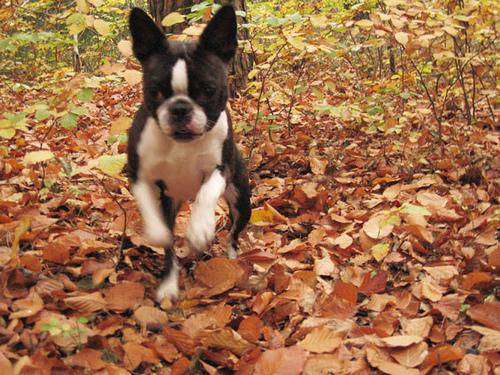

In [ ]:
# lets view an image
from IPython.display import Image
Image("/content/drive/MyDrive/dogo/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels

let's geta list of all our images files ID

In [ ]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#create pethnames from image ID'S
filenames=["/content/drive/MyDrive/dogo/train/"+ fname for fname in label_csv["id"] + ".jpg"]

filenames

['/content/drive/MyDrive/dogo/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dogo/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dogo/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dogo/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dogo/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dogo/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dogo/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dogo/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dogo/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dogo/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 '/content/drive/MyDrive/dogo/train/004396df1acd0f1247b740ca2b14616e.jpg',
 '/content/drive/MyDrive/dogo/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 '/content/drive/MyDrive/dogo/train/00693b8bc2470375cc744a6391d397ec.jpg',
 '/content/drive/MyDrive/

In [ ]:
## check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/dogo/train"))== len(filenames):
    print("yes they are equal")
else:
    print("not really")

yes they are equal


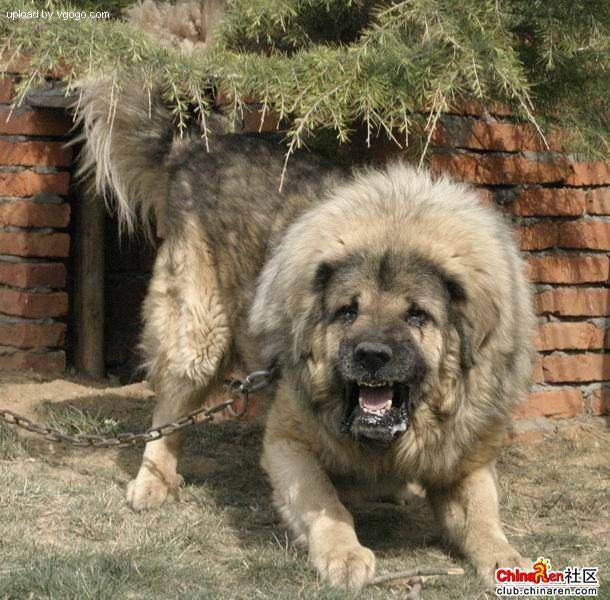

In [ ]:
# one more check
Image(filenames[9000])

since we've now got our tenaing image filepath in a list,lets prepare our labels

In [ ]:
label_csv

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [ ]:
import numpy as np
labels=label_csv["breed"].to_numpy()
#labels=np.array(labels) # does same thing

labels


array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
label_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
## see if numbers of labels matches the number of filenmes
if len(labels)==len(filenames):
  print("number of labels matches numbers of filenames!")
else:
  print("number of labels donot matches numbers of filenames!")

number of labels matches numbers of filenames!


## find the unique number of filenames

In [ ]:
unique_breeds=np.unique(labels)

unique_breeds
b

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# turn a isngle label into an array of booleans
print(labels[0])
len(unique_breeds)

labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
## turn every label into a boolean array
boolean_labels=[label==unique_breeds for label in labels]
print(boolean_labels[:2])
len(boolean_labels)

[array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False]), array([False, False, False, False, False, False, False, Fal

10222

In [ ]:
len(boolean_labels)

10222

In [ ]:
# example: tunring boolean array into integers
print(labels[0]) # orgonal label
print(np.where(unique_breeds==labels[0])) # index where label occurs
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:2]

['/content/drive/MyDrive/dogo/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dogo/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg']

###  creating our own validation set
since the dataset from kaggle didnt provide the validation set,

In [ ]:
# set up x & y varaibles
x=filenames
y=boolean_labels

we going to setar iff experimenting with~ 1000 images and increase as needed

In [ ]:
# set number of image to use for experimenting
NUM_IMAGES = 1000  #@param{type:"slider", min:1000, max:10000, step:1000}

In [ ]:
#lets split our data into train and valiadation sets
from sklearn.model_selection import train_test_split
x_train,x_val,y_train,y_val=train_test_=train_test_split(x[:NUM_IMAGES],
                                                        y[:NUM_IMAGES],
                                                         test_size=0.2,
                                                         random_state=42)

len(x_train),len(x_val),len(y_train),len(y_val)


(800, 200, 800, 200)

In [ ]:
#Lets have a gaze the taining data
x_train[:5],y_train[:5]

(['/content/drive/MyDrive/dogo/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/dogo/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/dogo/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/dogo/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/dogo/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False,

## Preprocessing images(turning imagesinto tensors)
To prepresocess oour images to tensors we're going to wrote a function which does a few things:

1. Tae animage filepath as input
2. use tensorflow to read the file and save it to a varibale, "image"
3. turn our "images"(a jpg) into tensors
4. normalize our imaeg(convert0-255 to 0-1)
5. Resize the "image" to be a shape of (224,224)
6. return the modified "image"

In [ ]:
# lets convert into numpy array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
#creating a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
from tensorflow.python.ops.logging_ops import ImageSummary
#dEFINE IMAGE SIZE
IMG_SIZE=224

#creatinga function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into a tensor
  """

  # read in an image file
  image=tf.io.read_file(image_path)
  #Turn he jpeg images into numerical tensor with 3 coilur channels(read,green,blue)
  image=tf.image.decode_jpeg(image,channels=3)
  #convert the colour channel values from 0-255 to 0-1 value

  image=tf.image.convert_image_dtype(image,tf.float32)
  # resize the image to our desired value
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

## turning our data into batches

Why turn our data into batches?

lets say you're trying to process 10000+ images in one go ... they all might not fir into memoru


so thats why we do 32(batch size) images at a time

in order to use TensorFlow effectivly, we need our data in the form of tensor tuples which look like this`(image,labels)`

In [ ]:
# creating a simple function to return a Tuple(images,label)
def get_image_label(image_path,label):
  """
  Takes an image file path name and the assosiated label,
  processes the image and returns a tuple of (image,label)

  """
  image=process_image(image_path)
  return image, label

In [ ]:
process_image(x[42]),y[42]

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

nOW WE.VE A WAY TO TURN OUR DATA INTO TUPLES OF Tensors
in the form:`(image,label)`, let's make a function to turn all of our data(x & y) into batches!

In [ ]:
BATCH_SIZE = 32 # Define BATCH_SIZE
def create_data_batches(x, y=None, batch_size=BATCH_SIZE,
                        valid_data=False, test_data=False):

    if test_data:
        print("Creating test data batches...")
        data = tf.data.Dataset.from_tensor_slices(tf.constant(x))
        data = data.map(process_image)
        data_batch = data.batch(batch_size)
        return data_batch

    elif valid_data:
        print("Creating validation data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                                   tf.constant(y)))
        # Use get_image_label instead of process_image for validation data
        data = data.map(get_image_label)
        data_batch = data.batch(batch_size)
        return data_batch

    else:
        print("Creating training data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                                   tf.constant(y)))
        data = data.shuffle(buffer_size=len(x))
        # Use get_image_label instead of process_image for training data
        data = data.map(get_image_label)
        data_batch = data.batch(batch_size)
        return data_batch


# Creating training and validation data batches
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# check out the diffeernt attribute of our data batches
train_data.element_spec, val_data.element_spec
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

## Visualizing Data Batches

our data is now in batches, however, these can be a alittle hard to understans,lets visualize it.

In [ ]:
import matplotlib.pyplot as plt

# Create a fucntion for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 imagea and thir label from the a data batch

  """
  #setup the figure
  plt.figure(figsize=(10,10))
  #loop through 25 images
  for i in range(25):
    #create subplots (5 rows, 5 columns)
    ax=plt.subplot(5,5, i+1)
    # Show image
    plt.imshow(images[i])
    #add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images,train_labels= next(train_data.as_numpy_iterator())
len(train_images),len(train_labels)

(32, 32)

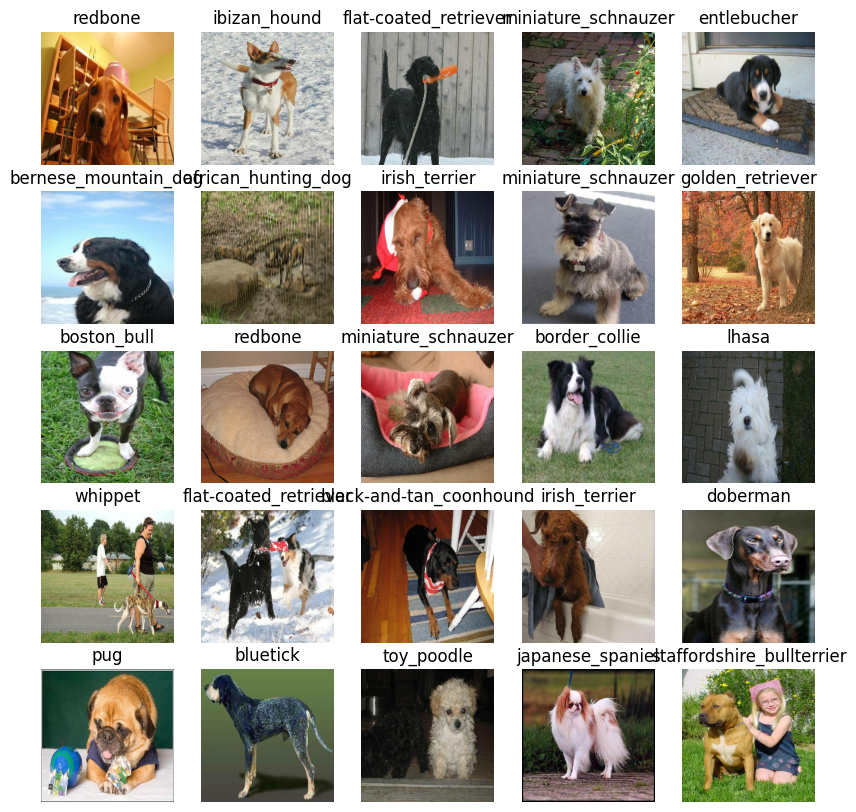

In [ ]:
show_25_images(train_images,train_labels)

### building model

beofre we biula a model, there are a few things we need to define:
* the inut shape(our images shape, in the form of tensors)to our mdel
* the output shape(imaeg laels,in the form of tensors) of our model
* The URL of the model we want to use

In [ ]:
from tensorflow.keras.applications import MobileNetV2

IMG_SIZE = 224

base_model = MobileNetV2(
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    include_top=False,   # remove classifier head
    weights="imagenet"
)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


NOw we've got input put and model ready to fo
lets put them togeter into a keras deep learning model!

Knowing this, lets creaet a function which:
* takes the imput shape, output shape and the model we've choasen as parameters.
* Defines a layer in a keras model in sequential fashion
(do this first, then this, then that).
* compiles the model(says it should be evaluated and improved).
* Builds the mofrl(tells the model the input shape it'll be getting)
* Returns the model.




In [ ]:
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]
OUTPUT_SHAPE=len(unique_breeds)


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2

IMG_SIZE = 224  # assuming this is global or passed

def create_model(
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    output_shape=None,          # must pass this (number of classes)
    trainable_base=False        # whether to unfreeze MobileNetV2 layers later
):
    print("Building MobileNetV2-based model")

    # Load pre-trained base (feature extractor)
    base_model = MobileNetV2(
        input_shape=input_shape,
        include_top=False,          # no final classification head
        weights="imagenet"
    )

    base_model.trainable = trainable_base  # usually False at first

    # Build the full model
    model = models.Sequential([
        base_model,
        layers.GlobalAveragePooling2D(),          # or Flatten() – GAP is better for MobileNet
        layers.Dense(output_shape, activation="softmax", name="classifier")
    ])

    # Compile
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),  # can lower later for fine-tuning
        metrics=["accuracy"]
    )

    # Optional: show summary right away
    model.summary()

    return model

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models

IMG_SIZE = 224
OUTPUT_SHAPE = len(unique_breeds)

# Load pretrained base
base_model = MobileNetV2(
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    include_top=False,
    weights="imagenet"
)

base_model.trainable = False  # freeze base model

# Build model
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(OUTPUT_SHAPE, activation="softmax")
])

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       153,720 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,411,704 (9.20 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

 ### creating callbacks

 callbacks are heper functions a model can use during training to so scuh things as save its progress,cheh its progressor stop trianing ealry if model stop improving

 we'll create two callbacks one for tensorboard which helps track our models progress and another for easly stopping which prevent our model from training for too long

 ### TensorBoard callback
 to setup tensorboard callback, we need to do 3 things:
 1. Load the TnesorBoard notebook extnsion
 2. create a tensorboard callback wihc is able to save logs to a directory and pass it to our model's `fit() ` function
 3. vsualize our models traing lofs with `%tensirboard` magic function(we'll do this after model training)

In [ ]:
# load tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
import os # Import the os module as it's used with os.path.join

# create a function to build a TensorBoard callback
def create_tensorboard_callback():
  #create a log directory for storing TensorBoard Logs
  logdir=os.path.join("/content/drive/MyDrive/dogo/logs",
                      #make it so the logs get tracked whenever we run an experiment
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S")) # Added missing closing parenthesis here
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps stop our model from overfitting by stopping traing if a certain evalution metric stops

In [ ]:
# create early stopping callback
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

##Training a model(on a subset of a data)

our first mdoel is only going to train on 1000 images, to make sure everythinf is working

In [ ]:
NUM_EPOCHES=100 #@param{type:"slider",min:10,max:100,step:10}

### let's create a fucntion which trains a model
* crate  a model using "create_ model()"
* setup a tensorboard callback using `create_tensorboard_callback()`
* call the `fit()` function on our model passing it the traininf data, validatin data, number of epoches to train for(`NUM_EPOCHES`) and the callbacks we's like to use
* return the model

In [ ]:
#Buila afunction to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  #create a model
  model=create_model(output_shape=OUTPUT_SHAPE)

  #create new tensorboard session everythime we train a model
  tensorboard=create_tensorboard_callback()

  #Fit the model to the data passing it the callback we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHES,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  #Return the fitten model
  return model

In [ ]:
#Fit the moel to the data
model=train_model()

Building MobileNetV2-based model


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classifier (Dense)              │ (None, 120)            │       153,720 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,411,704 (9.20 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 273s 10s/step - accuracy: 0.0473 - loss: 4.9355 - val_accuracy: 0.2550 - val_loss: 3.7675
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - accuracy: 0.5976 - loss: 2.3020 - val_accuracy: 0.4650 - val_loss: 2.5410
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 171ms/step - accuracy: 0.8946 - loss: 1.0283 - val_accuracy: 0.5400 - val_loss: 2.0137
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 209ms/step - accuracy: 0.9632 - loss: 0.5146 - val_accuracy: 0.5950 - val_loss: 1.8000
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - accuracy: 0.9923 - loss: 0.3026 - val_accuracy: 0.5900 - val_loss: 1.7184
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 182ms/step - accuracy: 0.9991 - loss: 0.2120 - val_accuracy: 0.6050 - val_loss: 1.6339
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 207ms/step - accuracy: 0.9997 - loss: 0.1543 - val_accuracy: 0.6100 - val_loss: 1.5973
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - accuracy: 0.9994 - loss: 0.1162 - val_accu

**QUESTION** it looks like our model is overfitting because it's perfomrming far better on the training datset than the validation set.
* some ways to prevent model overfitting in deep leanring neural network?

**Note** overfitting to begin with is a good thing! it mean our model is learning

### checking the TensorBoard logs

The TensorBoard magic function(`%tensorboard`) will access the logs directory we created eariler and visualize its content

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/dogo/logs/20260227-115209


<IPython.core.display.Javascript object>

In [ ]:
## Making and evaluating prediction using a trained model
pridictions=model.predict(val_data, verbose=1)
pridictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 760ms/step


array([[9.85464780e-04, 3.46933166e-03, 2.09133315e-04, ...,
        1.68890518e-04, 2.01712595e-04, 1.99687970e-03],
       [1.19126074e-04, 2.76279694e-04, 8.70181341e-03, ...,
        1.42049335e-04, 4.32584854e-03, 1.08259679e-04],
       [3.17775994e-05, 2.12539599e-04, 1.28285581e-04, ...,
        5.94788798e-05, 1.86940961e-05, 7.76331464e-04],
       ...,
       [9.77242365e-04, 8.95718404e-04, 7.72931089e-04, ...,
        6.51384296e-04, 3.81239224e-05, 4.84908407e-04],
       [1.04795874e-03, 4.81129136e-05, 4.34567162e-04, ...,
        4.15567338e-05, 2.95954924e-05, 5.09788794e-03],
       [2.37193803e-04, 1.20803406e-05, 3.86084401e-04, ...,
        1.07666478e-03, 2.32019636e-04, 9.50239075e-04]], dtype=float32)

In [ ]:
pridictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
np.sum(pridictions[0])

np.float32(1.0)

In [ ]:
#First predictions
index=109
print(pridictions[index])
print(f'max value(probabillity of prediction): {np.max(pridictions[index])}')
print(f'sum:{np.sum(pridictions[index])}')
print(f'predicted label:{unique_breeds[np.argmax(pridictions[index])]}')


[9.54052393e-06 3.71114584e-05 6.73611248e-06 1.17216939e-06
 4.93734551e-04 3.91417174e-08 4.73403730e-07 8.41103974e-06
 2.81167013e-05 1.63856457e-05 3.53463906e-06 1.60901081e-07
 4.29910469e-05 2.05103333e-06 7.32716359e-03 3.99535975e-06
 2.55971997e-07 1.14483926e-04 3.37940691e-07 1.34351130e-05
 2.65507197e-06 3.28374170e-02 6.04155612e-05 2.91021453e-04
 5.85922919e-07 9.25613880e-01 1.48769379e-06 1.63287768e-06
 3.68222158e-04 1.94688491e-05 1.25898879e-07 7.61104911e-06
 9.54250254e-07 1.54426004e-07 8.55974431e-05 2.39661335e-06
 3.42218368e-06 5.13814393e-06 3.91029062e-05 4.45885271e-05
 1.99142278e-06 1.08047686e-07 7.34188734e-06 1.68125268e-07
 3.67146531e-05 7.26530852e-05 1.70811722e-06 1.78720875e-04
 8.21987396e-06 7.25001955e-05 1.57927116e-06 2.58981308e-04
 2.14457377e-05 4.25588478e-05 8.01741677e-08 1.48374204e-06
 1.32593107e-06 1.32871901e-05 1.53106539e-05 3.28453971e-05
 2.27092794e-04 1.71243119e-06 6.18231525e-07 4.01383062e-07
 2.94276720e-06 1.308289

In [ ]:
unique_breeds[109]

'tibetan_terrier'

having the above functionalities is great but we want to be abe to do it at scale

and it would eb even better if we couls see the image predction is being made-on!

**Note** prediction probablities are also know as confidance levels.

In [ ]:
#Turn prediction probablities into their respective label(easier to undestand)
def get_pred_label(prediction_probablities):
  """
  Turns an array of prediction probablities into a label
  """
  return unique_breeds[np.argmax(prediction_probablities)]

#Get a predicted label based on an aray prediction probablities
pred_label=get_pred_label(pridictions[81]) # Corrected variable name from 'predictions' to 'pridictions'
pred_label

'irish_setter'

Now since our validaition data is stilla batch dataset,
we'll have unbachtify it to make preduction on the validation imae and then compare those predictions tothe validation label(truth labels).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
## Create a function to unbatch abatch dataset
def unbachtify(data):
    """
    Takes a tf.data.Dataset and returns two lists:
    images_ and labels_ (unbatched).
    """
    images_ = []
    labels_ = []

    # Loop through unbatched dataset
    for image, label in data.unbatch().as_numpy_iterator():
        images_.append(image)
        labels_.append(label)

    return images_, labels_

#unbachtify  the validation data
val_images,val_labels=unbachtify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
images_=[]
labels_=[]

#loop through unbatched data
for image ,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(pridictions[0])

'tibetan_terrier'

Now we've ways to get get:
* Prediction labels
* validation labels(truth labels)
* validation images

let's make some fuction to make htese all a bit more visaulize.

we'll create a function whihc:
* takes an array of prediction probablities, an array of  truth labels and an rray of images an intrgers.
* covnvert the prediction probabliities to a predicted label.
* plot the predicted label, its predicted probablitiy, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probablities, labels, images, n=0):
  """
  View the prediction, ground truth label and image for sample n
  """
  # Get the predicted probability array for sample n
  pred_prob = prediction_probablities[n]

  # Get the true label array for sample n
  true_label = unique_breeds[np.argmax(labels[n])]

  # Get the image for sample n
  image = images[n]

  #get the pred label
  pred_label=get_pred_label(pred_prob)

  # plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Change plot title to be predicted, probability of prediction and truth label
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  plt.title(f"{pred_label} {np.max(pred_prob)*100:.0f}% ({true_label})", color=color)


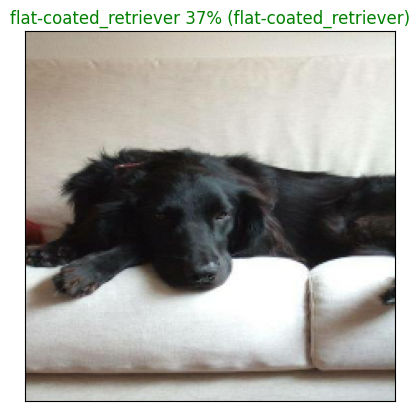

In [ ]:
plot_pred(prediction_probablities=pridictions,
          labels=val_labels,
          images=val_images,
          n=20)

now we've got one funciyon to visualiz our model top prediction.ets maek another to view our models top 10 prediction

The functions will:
* Take an inpit of predction probablities array and a ground truth array and an intger
* find the prediction using `get_pred_label()`
* find the top 10
    * Prediction probablities indexes
    * predictions probablities values
    * prediction labels
* plot the top 10 prediction probablitiey value and labels, cooring the true label green

In [ ]:
def plot_pred_conf(prediction_probablities,labels,n=1):
  """
  Plots the top 10 highest prediction probabilities and their labels
  """
  # Get prediction probabilities for sample n
  pred_prob = prediction_probablities[n]

  # Get the true label (breed name string) for sample n
  # labels[n] is a boolean array, so use np.argmax to get the index of True
  true_label_boolean_array = labels[n]
  true_label = unique_breeds[np.argmax(true_label_boolean_array)]

  #Get the predicted label
  pred_label=get_pred_label(pred_prob)

  #Find the top 10 prediction cofidance indexes
  top_10_pred_indeces=np.argsort(pred_prob)[-10:][::-1]

  #find the top 10 prediction confiance values
  top_10_pred_values=pred_prob[top_10_pred_indeces]

  #finding the top prediction labels
  top_10_pred_labels=np.array(unique_breeds)[top_10_pred_indeces]

  #setup plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  #change color of true label
  if np.isin(true_label, top_10_pred_labels):
    # The true_label is a string, compare it with the array of strings and get the index
    true_label_index_in_top_10 = np.where(top_10_pred_labels == true_label)[0][0]
    top_plot[true_label_index_in_top_10].set_color("green")
  else:
    pass


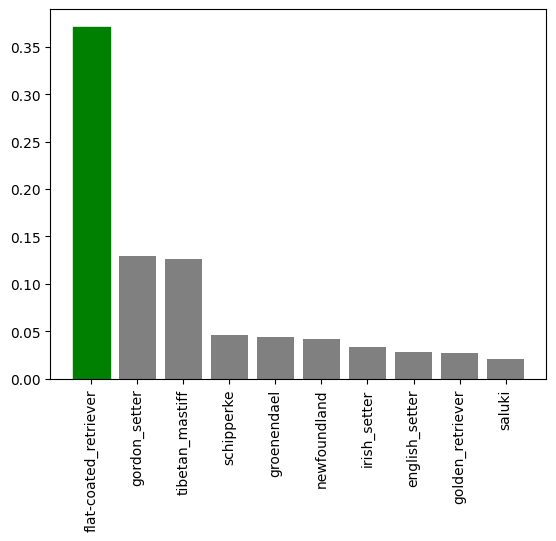

In [ ]:
plot_pred_conf(prediction_probablities=pridictions,
               labels=val_labels,
               n=20)

Now we've got some functions to help us visualize our predictions and evaluate pur model, lets see a few

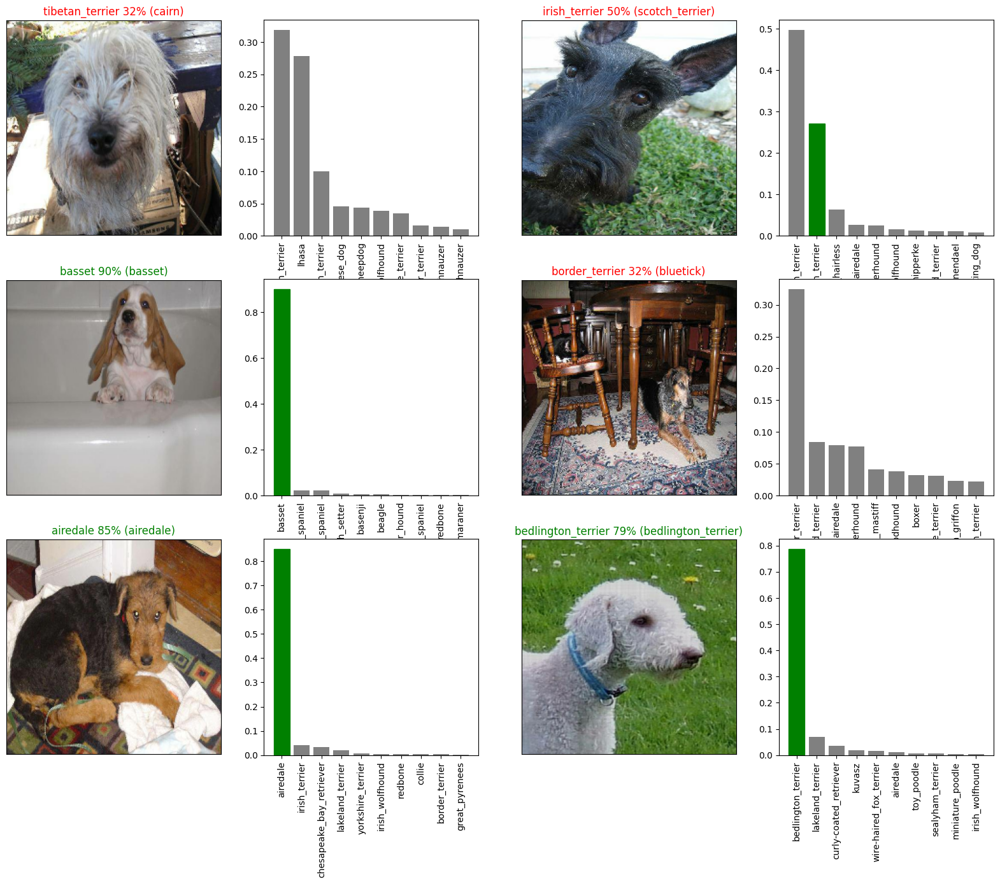

In [ ]:
# let's chcek out a few predictions and their differnt values
i_multiplier=0
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols, 2*i+1) # Added subplot position
  plot_pred(prediction_probablities=pridictions,
              labels=val_labels,
              images=val_images,
              n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probablities=pridictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.show()

**Saving and reloading a model**

In [ ]:
# let's chcek out a few predictions and their differnt values
i_multiplier=0
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols, 2*i+1) # Added subplot position
  plot_pred(prediction_probablities=pridictions,
              labels=val_labels,
              images=val_images,
              n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probablities=pridictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.show()